Ce notebook parcours la démarche de modélisation pour la classification des images du projet 6 en se basant sur l'algorithme CLIP d'Open AI datant de 2021 ([code source](https://github.com/openai/CLIP/blob/main/clip/model.py)).

# Initialisation

In [ ]:
# Chemin vers le fichier CSV et le répertoire contenant les images
csv_file = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/tab_desc_img.csv'
image_dir = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images'

In [ ]:
# data
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
path_desc_img = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/flipkart_com-ecommerce_sample_1050.csv'
data_source = pd.read_csv(path_desc_img)

Mounted at /content/drive


In [ ]:
data = data_source['image'].copy()
data.to_csv('/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/tab_desc_img.csv', index=False)

In [ ]:
data.head()

0    55b85ea15a1536d46b7190ad6fff8ce7.jpg
1    7b72c92c2f6c40268628ec5f14c6d590.jpg
2    64d5d4a258243731dc7bbb1eef49ad74.jpg
3    d4684dcdc759dd9cdf41504698d737d8.jpg
4    6325b6870c54cd47be6ebfbffa620ec7.jpg
Name: image, dtype: object

In [ ]:
import numpy as np
import tqdm

# We build category list with only top of the category tree
X = np.array(data_source['product_category_tree'])

# only keep the first category in each X elt
X_cat = [] # initialized category list
for i in range(len(X)):

  s = X[i]
  a, b = s.find('"') + 1, s.find(' >> ')
  cat = s[a : b]

  X_cat.append(cat)

In [ ]:
np.unique(np.array(X_cat))

array(['Baby Care', 'Beauty and Personal Care', 'Computers',
       'Home Decor & Festive Needs', 'Home Furnishing',
       'Kitchen & Dining', 'Watches'], dtype='<U26')

In [ ]:
# dictionnaire encodage étiquettes de catégories produit
Cat_int_to_text = {i: np.unique(np.array(X_cat))[i] for i in range(len(np.unique(np.array(X_cat))))}
Cat_text_to_int = {np.unique(np.array(X_cat))[i]: i for i in range(len(np.unique(np.array(X_cat))))}
Cat_text_to_int

{'Baby Care': 0,
 'Beauty and Personal Care': 1,
 'Computers': 2,
 'Home Decor & Festive Needs': 3,
 'Home Furnishing': 4,
 'Kitchen & Dining': 5,
 'Watches': 6}

In [ ]:
Cat_int_to_text

{0: 'Baby Care',
 1: 'Beauty and Personal Care',
 2: 'Computers',
 3: 'Home Decor & Festive Needs',
 4: 'Home Furnishing',
 5: 'Kitchen & Dining',
 6: 'Watches'}

In [ ]:
# vrai labels à comparer avec les labels predits
true_labels = [Cat_text_to_int[X_cat[i]] for i in range(len(X_cat))]

In [ ]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 746.1 kB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-fydtgdh0
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-fydtgdh0
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x8

In [ ]:
# imports
import torch
import clip
import csv
from PIL import Image
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from torch.utils.data import DataLoader, Dataset
import os

In [ ]:
# Définir les transformations pour les images
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from PIL import Image
image_transform = Compose([
    Resize(224),
    CenterCrop(224),
    ToTensor(),
    Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


# Approche 1 : zero shot

## Texte catégories brute

Pas d'entraînement. Utilisation des images et des noms basiques de catégories.

Les images sont prétraitées avec les outil torch (redimension, centrée, normée, conversion tenseur) puis encodées par la méthode de CLIP.

Les textes (nom des catégories) sont simplement encodés par la méthode CLIP.

In [ ]:
from torch.utils.data import DataLoader, Dataset
import csv

In [ ]:
import torch
import clip
import csv
from PIL import Image
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from torch.utils.data import DataLoader, Dataset
import os

# Charger le modèle CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

In [ ]:
# Définir les transformations pour les images
image_transform = Compose([
    Resize(224),
    CenterCrop(224),
    ToTensor(),
    Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Définir un Dataset personnalisé pour charger les données
class CustomDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        # Charger les données à partir du fichier CSV
        with open(csv_file, newline='', encoding='utf-8') as csvfile:
            reader = csv.reader(csvfile)
            next(reader)
            self.data = list(reader)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image_path = os.path.join(self.image_dir, item[0])
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

# Chemin vers le fichier CSV et le répertoire contenant les images
csv_file = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/tab_desc_img.csv'
image_dir = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images'

# Charger les données dans le Dataset
dataset = CustomDataset(csv_file, image_dir, transform=image_transform)

# Utiliser DataLoader pour charger les données en lots
data_loader = DataLoader(dataset, batch_size=32, shuffle=False)

In [ ]:
# encoder les catégories produits
texts = clip.tokenize(np.unique(np.array(X_cat))).to(device)
with torch.no_grad():
  text_features = model.encode_text(texts)

# Classifier les produits
all_predictions = []
for images in data_loader:
    # Prétraiter les images et le texte
    images = images.to(device)

    # Calculer les embeddings pour les images et le texte
    with torch.no_grad():
        image_features = model.encode_image(images)

    # Calculer les similarités entre les images et le texte
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)

    # Obtenir les prédictions
    _, predicted_labels = similarity.max(dim=-1)
    all_predictions.extend(predicted_labels.cpu().numpy())

# Afficher les prédictions
print(all_predictions)

In [ ]:
# comparaison
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def Eval_Prediction(true_labels, predictions):
  accuracy = np.mean((true_labels == predictions).astype(float)) * 100.
  print(f"Accuracy = {accuracy:.3f}")
  print(classification_report(true_labels, predictions))
  conf_mat = confusion_matrix(true_labels, predictions)
  conf_mat_df = pd.DataFrame(conf_mat, index = np.unique(np.array(X_cat)), columns = np.unique(np.array(X_cat)))
  plt.figure(figsize = (6,4))
  sns.heatmap(conf_mat_df, annot=True, cmap="Blues")

Accuracy = 54.571
              precision    recall  f1-score   support

           0       0.84      0.57      0.68       150
           1       0.44      0.90      0.59       150
           2       0.95      0.38      0.54       150
           3       0.71      0.08      0.14       150
           4       0.35      0.89      0.51       150
           5       0.50      0.01      0.01       150
           6       0.82      0.99      0.90       150

    accuracy                           0.55      1050
   macro avg       0.66      0.55      0.48      1050
weighted avg       0.66      0.55      0.48      1050



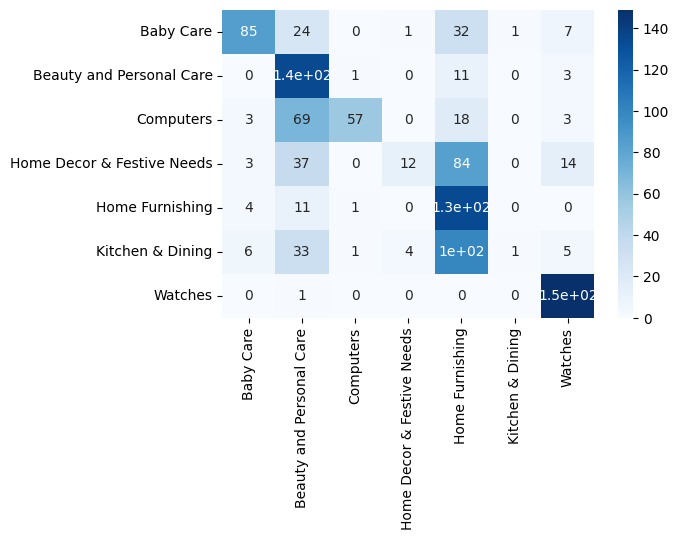

In [ ]:
Eval_Prediction(np.array(true_labels), np.array(all_predictions))

## Texte catégories augmenté

In [ ]:
# ajout de quelques mots dans les noms de catégories
categories = [
    "Products for baby care",
    "Beauty and personal care products",
    "Computing devices",
    "Home decoration and festive needs items",
    "Home furnishing products",
    "Kitchen and dining items",
    "Wristwatches"
]

In [ ]:
# encoder les catégories produits
texts_2 = clip.tokenize(categories).to(device)
with torch.no_grad():
  text_features_2 = model.encode_text(texts_2)

# Classifier les produits
all_predictions_2 = []
for images in data_loader:
    # Prétraiter les images et le texte
    images = images.to(device)

    # Calculer les embeddings pour les images et le texte
    with torch.no_grad():
        image_features = model.encode_image(images)

    # Calculer les similarités entre les images et le texte
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)

    # Obtenir les prédictions
    _, predicted_labels = similarity.max(dim=-1)
    all_predictions_2.extend(predicted_labels.cpu().numpy())

# Afficher les prédictions
print(all_predictions_2)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


[4, 4, 4, 4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 4, 4, 4, 4, 4, 0, 4, 6, 1, 4, 4, 4, 1, 1, 1, 4, 1, 1, 2, 2, 2, 6, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4, 4, 1, 0, 4, 4, 1, 0, 0, 6, 4, 1, 4, 0, 4, 6, 0, 0, 4, 4, 1, 2, 1, 1, 4, 1, 6, 4, 4, 1, 0, 1, 1, 1, 4, 1, 4, 4, 4, 4, 0, 1, 4, 4, 0, 4, 0, 1, 0, 1, 4, 0, 4, 1, 4, 0, 0, 4, 2, 1, 1, 1, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 3, 4, 1, 4, 4, 4, 3, 4, 4, 1, 1, 4, 4, 0, 4, 3, 4, 4, 1, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 6, 4, 4, 4, 4, 4, 4, 4, 0, 4, 4, 4, 0, 4, 6, 4, 4, 1, 4, 1, 6, 1, 0, 4, 4, 3, 4, 4, 4, 3, 6, 4, 4, 1, 4, 6, 4, 4, 4, 4, 0, 1, 4, 1, 6, 4, 4, 1, 6, 4, 4, 3, 1, 4, 4, 1, 4, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 6, 4, 4, 4, 3, 4, 4, 4, 1, 4, 1, 1, 4, 4, 4, 4, 1, 0, 6, 6, 6, 6, 6, 4, 4, 6, 3, 6, 6, 4, 0, 4, 4, 3, 1, 0, 0, 6, 1, 0, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1, 2, 

Accuracy = 54.571
              precision    recall  f1-score   support

           0       0.84      0.57      0.68       150
           1       0.44      0.90      0.59       150
           2       0.95      0.38      0.54       150
           3       0.71      0.08      0.14       150
           4       0.35      0.89      0.51       150
           5       0.50      0.01      0.01       150
           6       0.82      0.99      0.90       150

    accuracy                           0.55      1050
   macro avg       0.66      0.55      0.48      1050
weighted avg       0.66      0.55      0.48      1050



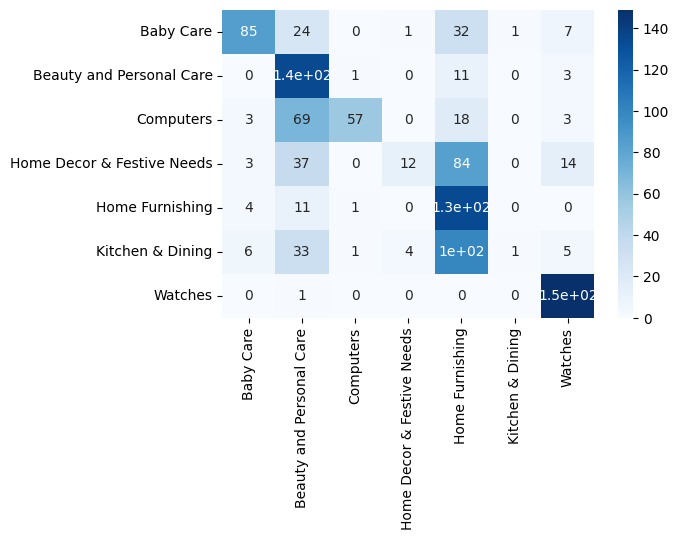

In [ ]:
Eval_Prediction(np.array(true_labels), np.array(all_predictions_2))

# Approche 2 : Fine-tuning du Modèle

## Préparation des données

Ajout de couches de neurones en avale de l'encodage d'image.

création des set de train validation et test.

In [ ]:
from sklearn.model_selection import train_test_split

data = data_source['image'].copy()
cat = pd.Series(true_labels.copy(), name='labels')

train_set, test_set, cat_train, cat_test = train_test_split(data, cat, stratify=cat, test_size=0.4, random_state=42)
test_set, validation_set, cat_test, cat_validation = train_test_split(test_set, cat_test, test_size=0.5, random_state=42)

print(train_set.shape)
print(validation_set.shape)
print(test_set.shape)
print(cat_train.shape)
print(cat_validation.shape)
print(cat_test.shape)

pd.concat([train_set, cat_train], axis=1).to_csv('/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/train_set.csv', index=False)
pd.concat([validation_set, cat_validation], axis=1).to_csv('/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/validation_set.csv', index=False)
pd.concat([test_set, cat_test], axis=1).to_csv('/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/test_set.csv', index=False)

(630,)
(210,)
(210,)
(630,)
(210,)
(210,)


In [ ]:
# Définir un Dataset personnalisé pour charger les données incluant les labels
class CustomDatasetLabel(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        # Charger les données à partir du fichier CSV
        with open(csv_file, newline='', encoding='utf-8') as csvfile:
            reader = csv.reader(csvfile)
            next(reader)
            self.data = list(reader)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image_path = os.path.join(self.image_dir, item[0])
        image = Image.open(image_path).convert("RGB")
        label = int(item[1])
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
# Chemin vers le fichier CSV et le répertoire contenant les images
csv_file_2 = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/'

# Charger les données dans le Dataset
dataset_train = CustomDatasetLabel(csv_file_2 + 'train_set.csv', image_dir, transform=image_transform)
dataset_validation = CustomDatasetLabel(csv_file_2 + 'validation_set.csv', image_dir, transform=image_transform)
dataset_test = CustomDatasetLabel(csv_file_2 + 'test_set.csv', image_dir, transform=image_transform)

# Utiliser DataLoader pour charger les données en lots
train_data_loader = DataLoader(dataset_train, batch_size=32, shuffle=False)
val_data_loader = DataLoader(dataset_validation, batch_size=32, shuffle=False)
test_data_loader = DataLoader(dataset_test, batch_size=32, shuffle=False)

## Entraînement

In [ ]:
import torch.nn as nn
import torch.optim as optim

# Définir un réseau de neurones simple pour la classification
class Classifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(Classifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 512)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

# focntion d'évaluation
def evaluate_accuracy_loss(data_loader, model, classifier, device):
    model.eval()
    classifier.eval()
    correct = 0
    total = 0
    epoch_loss = 0
    #batch_idx = 0
    with torch.no_grad():
        for images, labels in data_loader:
            #batch_idx += 1
            #if batch_idx>= 2:
            #  break
            # transfert sur cpu
            images = images.to(device)
            labels = labels.to(device)
            # encodage
            image_features = model.encode_image(images)
            # calcul de la sortie
            outputs = classifier(image_features)
            # conversion de sorties en label
            _, predicted = torch.max(outputs.data, 1)
            # somme des exactitude
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            # calcul du loss
            loss = criterion(outputs, labels)
            epoch_loss += loss.item()

    # Calculer la perte moyenne pour cette époque
    epoch_loss /= len(data_loader)
    # moyenne des exactitudes (accuracy)
    accuracy = 100 * correct / total

    return accuracy, epoch_loss

# Initialiser le modèle, la perte et l'optimiseur
num_classes = 7  # Nombre de catégories
input_dim = 512  # image_features.shape[1]  # Dimension des features extraites par CLIP
classifier = Classifier(input_dim, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(classifier.parameters(), lr=0.001)

# Listes pour stocker les historiques
train_losses = []
val_losses = []
train_accuracies  =[]
val_accuracies = []
weight_files = []

# Entraîner le modèle
num_epochs = 10
for epoch in range(num_epochs):
    correct = 0
    total = 0
    epoch_loss = 0
    classifier.train()
    #batch_idx = 0
    for images, labels in train_data_loader:
        #batch_idx += 1
        #if batch_idx>= 2:
        #  break
        images = images.to(device)
        labels = labels.to(device)
        with torch.no_grad():
            image_features = model.encode_image(images)

        # Passer les features par le classificateur
        outputs = classifier(image_features)

        # calcul de l'accuracy sur ce batch
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    # Calculer la perte moyenne pour cette époque
    epoch_loss /= len(train_data_loader)
    train_losses.append(epoch_loss)

    # moyenne de l'accuracy sur l'epoch
    accuracy = 100 * correct / total
    train_accuracies.append(accuracy)

    # Évaluation de l'accuracy sur les données de validation
    val_accuracy, val_epoch_loss = evaluate_accuracy_loss(val_data_loader, model, classifier, device)
    val_accuracies.append(val_accuracy)
    val_losses.append(val_epoch_loss)

    # Sauvegarder les poids du modèle
    weight_file = f'classifier_epoch_{epoch+1}.pth'
    torch.save(classifier.state_dict(), csv_file_2 + '/' + weight_file)
    weight_files.append(weight_file)

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.2f}, Validation Loss: {val_epoch_loss:.2f}, Accuracy: {accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%')


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Epoch [1/10], Loss: 0.62, Validation Loss: 0.53, Accuracy: 73.97%, Validation Accuracy: 86.67%
Epoch [2/10], Loss: 0.29, Validation Loss: 0.38, Accuracy: 87.46%, Validation Accuracy: 88.57%
Epoch [3/10], Loss: 0.15, Validation Loss: 0.37, Accuracy: 91.27%, Validation Accuracy: 89.52%
Epoch [4/10], Loss: 0.10, Validation Loss: 0.36, Accuracy: 93.81%, Validation Accuracy: 89.52%
Epoch [5/10], Loss: 0.08, Validation Loss: 0.35, Accuracy: 96.83%, Validation Accuracy: 90.00%
Epoch [6/10], Loss: 0.05, Validation Loss: 0.34, Accuracy: 98.73%, Validation Accuracy: 90.95%
Epoch [7/10], Loss: 0.03, Validation Loss: 0.35, Accuracy: 99.05%, Validation Accuracy: 90.48%
Epoch [8/10], Loss: 0.02, Validation Loss: 0.35, Accuracy: 99.37%, Validation Accuracy: 90.95%
Epoch [9/10], Loss: 0.02, Validation Loss: 0.37, Accuracy: 99.52%, Validation Accuracy: 90.00%
Epoch [10/10], Loss: 0.01, Validation Loss: 0.37, Accuracy: 99.84%, Validation Accuracy: 90.95%


In [ ]:
df_model = pd.DataFrame({
    'epoch_nb': [i for i in range(1, len(train_losses) + 1)],
    'train_losses': train_losses,
    'val_losses': val_losses,
    'train_accuracies': train_accuracies,
    'val_accuracies': val_accuracies,
    'weight_files': weight_files
})
df_model.to_csv('/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/df_model.csv', index=False)

## Résultats

Courbes de perte et de précision en fonction des epoch.

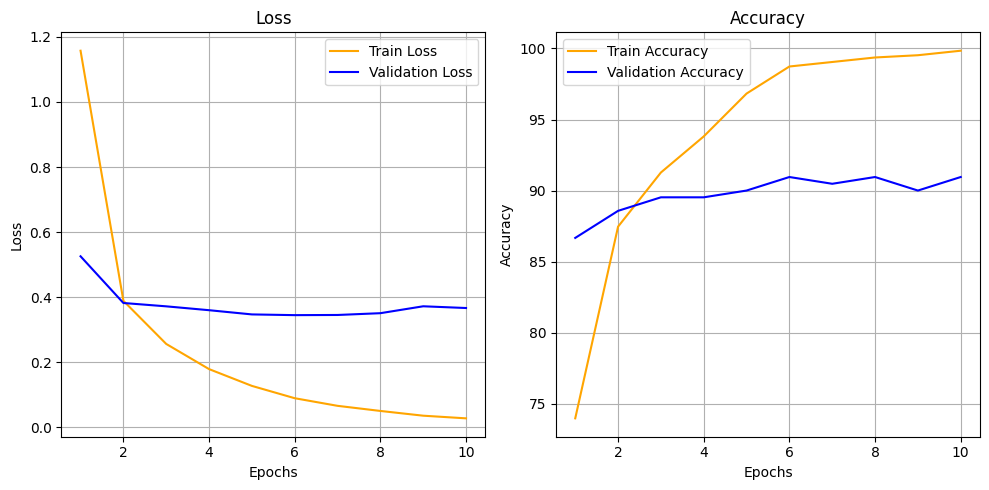

<Figure size 640x480 with 0 Axes>

In [ ]:
# Créer une nouvelle figure et définir les sous-graphiques
plt.figure(figsize=(10, 5))
x = df_model['epoch_nb']

# graphique des loss
plt.subplot(1, 2, 1)  # 1 ligne, 2 colonnes, premier graphique
plt.plot(x, df_model['train_losses'], color='orange', linestyle='-', label= "Train Loss")
plt.plot(x, df_model['val_losses'], color='blue', linestyle='-', label= "Validation Loss")
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# graphique des accuracies
plt.subplot(1, 2, 2)  # 1 ligne, 2 colonnes, deuxième graphique
plt.plot(x, df_model['train_accuracies'], color='orange', linestyle='-', label= "Train Accuracy")
plt.plot(x, df_model['val_accuracies'], color='blue', linestyle='-', label= "Validation Accuracy")
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

plt.tight_layout()

# Afficher la figure
plt.show()

plt.savefig(csv_file_2 + 'clip_accuracy_loss_graphique.png')

Au-delà de l'epoch n°3 les performances stagnent sur le set de validation et l'overfitting augmente.

## Evaluation

chargement des poids.

In [ ]:
def LoadWeight(epoch=4):
  """
  Charge les poids d'une epoch d'entraînement: epoch
  renvoi le modele avec les poids
  """
  # chargement des poids
  weight_file = f'classifier_epoch_{epoch}.pth'
  classifier.load_state_dict(torch.load(csv_file_2 + '/' + weight_file))
  return classifier

def MakePrediction(classifier, data_loader=test_data_loader):
  """
  Evalue les performances sur un dataset: data_loader
  Retourne des prédictions de labels.
  """
  # Mettre le modèle en mode évaluation
  classifier.eval()

  # Faire des prédictions sur un jeu de données
  all_predictions = []
  #batch_idx = 0
  with torch.no_grad():
      for images, labels in data_loader:
          #batch_idx += 1
          #if batch_idx>= 2:
          #  break
          images = images.to(device)

          # Extraire les features des images
          image_features = model.encode_image(images)

          # Passer les features par le classificateur
          outputs = classifier(image_features)

          # Obtenir les prédictions
          _, predicted_labels = torch.max(outputs, 1)
          all_predictions.extend(predicted_labels.cpu().numpy())

  # Retourne les prédictions
  return np.array(all_predictions)

récupération des vraix labels du set de test.

In [ ]:
data_test = pd.read_csv('/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/test_set.csv')
true_test = np.array(data_test['labels'])

Accuracy = 87.143
              precision    recall  f1-score   support

           0       0.73      0.73      0.73        30
           1       0.90      0.87      0.88        30
           2       0.91      0.94      0.92        31
           3       0.84      0.79      0.81        33
           4       0.82      0.88      0.85        26
           5       0.88      0.91      0.89        23
           6       1.00      0.97      0.99        37

    accuracy                           0.87       210
   macro avg       0.87      0.87      0.87       210
weighted avg       0.87      0.87      0.87       210



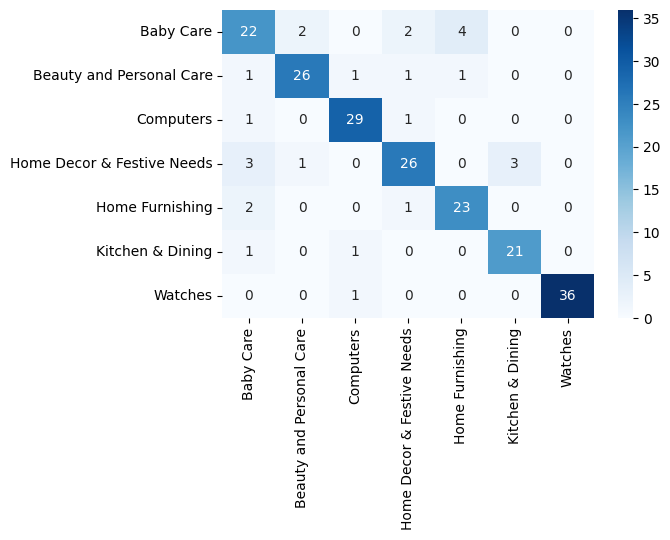

In [ ]:
# choix d'une epoch à charger
classifier_weighted = LoadWeight(epoch=3)
fine_tune_predictions = MakePrediction(classifier_weighted, test_data_loader)
Eval_Prediction(true_test, fine_tune_predictions)

# Fusion de clip et fine tune

In [ ]:
for img, label in train_data_loader:
  img_batch = img
  img = img[0]
  break

In [ ]:
img.shape, img_batch.shape

(torch.Size([3, 224, 224]), torch.Size([32, 3, 224, 224]))

In [ ]:
import torch
import torch.nn as nn
import clip
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Définir la classe complète incluant CLIP et le classificateur
class FullModel(nn.Module):
    def __init__(self, clip_model, classifier):
        super(FullModel, self).__init__()
        self.clip_model = clip_model
        self.classifier = classifier

    def forward(self, image):
        if image.dim() == 3: image = image.unsqueeze(0)
        with torch.no_grad():
            features = self.clip_model.encode_image(image)
        output = self.classifier(features)
        output_labels = torch.max(output, 1)[1].numpy()
        return output, output_labels   #, features

# Définir un réseau de neurones simple pour la classification
class Classifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(Classifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 512)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

# Charger le modèle CLIP et les transformations
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device)

# Classifier model
classifier = Classifier(512, 7).to(device)
classifier = LoadWeight(epoch=3)

# Créer le modèle complet
model = FullModel(clip_model, classifier).to(device)

In [ ]:
true_test, fine_tune_predictions = [], []
for images, labels in test_data_loader:
  true_test.extend(labels.numpy())
  fine_tune_predictions.extend(model(images)[1])

Accuracy = 87.143
              precision    recall  f1-score   support

           0       0.73      0.73      0.73        30
           1       0.90      0.87      0.88        30
           2       0.91      0.94      0.92        31
           3       0.84      0.79      0.81        33
           4       0.82      0.88      0.85        26
           5       0.88      0.91      0.89        23
           6       1.00      0.97      0.99        37

    accuracy                           0.87       210
   macro avg       0.87      0.87      0.87       210
weighted avg       0.87      0.87      0.87       210



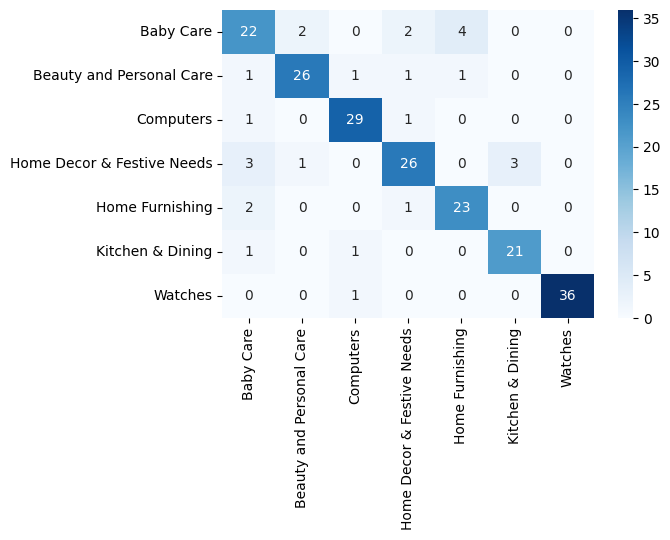

In [ ]:
Eval_Prediction(np.array(true_test), np.array(fine_tune_predictions))

# Comparaison avec VGG16

In [ ]:
# Charger le modèle à partir du fichier
from tensorflow.keras.models import load_model
path_vgg = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/'
modelVGG = load_model(path_vgg + 'mon_modele.h5')

In [ ]:
model1_save_path1 = path_vgg + "model1_best_weights.h5"
modelVGG.load_weights(model1_save_path1)

In [ ]:
import pandas as pd
data_test_vgg = pd.read_csv(csv_file_2 + 'test_set.csv')
print(data_test_vgg.shape)
data_test_vgg.head()

(210, 2)


,image,labels
0,653826cd53f1d9e2c086c0ac7846ef70.jpg,6
1,0ddc40c08d9a9bafc4d14eddd98db7c0.jpg,5
2,c0a7134d52d4aa3eb5874aef112f809f.jpg,6
3,91795f4b0e4aac27314477a91b63bfb7.jpg,1
4,109e235d4838002246599f987d935c21.jpg,0


In [ ]:
# la numérotation des catégories pour l'entraînement VGG16 projet 6 est la même que dans ce projet
labels_vgg = { 0: 'Baby Care',
                    1: 'Beauty and Personal Care',
                    2: 'Computers',
                    3: 'Home Decor & Festive Needs',
                    4: 'Home Furnishing',
                    5: 'Kitchen & Dining',
                    6: 'Watches'}

# récupération des labels du set de test
import os

labels_test = []
for im, label in test_data_loader:
  labels_test.extend(label.detach().numpy())
print(len(labels_test))

In [ ]:
def Eval_PredictionVGG(true_labels, predictions):
  accuracy = np.mean((true_labels == predictions).astype(float)) * 100.
  print(f"Accuracy = {accuracy:.3f}")
  print(classification_report(true_labels, predictions))
  conf_mat = confusion_matrix(true_labels, predictions)
  conf_mat_df = pd.DataFrame(conf_mat, index = [labels_vgg[i] for i in labels_vgg.keys()], columns = [labels_vgg[i] for i in labels_vgg.keys()])
  plt.figure(figsize = (6,4))
  sns.heatmap(conf_mat_df, annot=True, cmap="Blues")

In [ ]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def image_prep_fct(data) :
    prepared_images = []
    for image_num in range(data.shape[0]):
        img = (load_img(
            image_dir + '/' + data.image[image_num],
            target_size=(224, 224)))
        img = img_to_array(img)
        img = img.reshape((img.shape[0], img.shape[1], img.shape[2]))
        img = preprocess_input(img)
        prepared_images.append(img)
        prepared_images_np = np.array(prepared_images)
    return prepared_images_np

In [ ]:
images_np = image_prep_fct(data_test_vgg)
print(images_np.shape)

(210, 224, 224, 3)


In [ ]:
logVGGpred = modelVGG.predict(images_np)
VGGpred = np.argmax(logVGGpred, axis=1)

7/7 [==============================] - 1s 129ms/step


In [ ]:
VGGpred

array([6, 5, 6, 1, 0, 3, 1, 3, 5, 5, 2, 4, 2, 6, 1, 6, 5, 6, 6, 1, 1, 1,
       2, 6, 3, 3, 3, 6, 4, 4, 5, 0, 0, 4, 1, 6, 5, 2, 3, 6, 2, 2, 2, 3,
       4, 6, 5, 1, 0, 2, 3, 2, 3, 0, 0, 6, 1, 2, 3, 2, 2, 6, 2, 3, 2, 6,
       0, 1, 4, 0, 0, 3, 6, 1, 1, 5, 5, 4, 1, 0, 5, 2, 6, 4, 4, 0, 5, 4,
       5, 0, 4, 1, 1, 5, 0, 3, 1, 2, 4, 3, 1, 5, 4, 6, 3, 4, 2, 2, 4, 4,
       5, 6, 1, 0, 2, 4, 3, 1, 6, 4, 5, 3, 1, 6, 3, 2, 6, 6, 2, 2, 6, 4,
       0, 6, 1, 6, 4, 4, 2, 0, 1, 3, 0, 4, 5, 6, 3, 5, 6, 5, 3, 4, 3, 1,
       5, 1, 3, 3, 6, 1, 4, 3, 4, 1, 2, 1, 1, 2, 0, 1, 2, 5, 3, 6, 0, 4,
       2, 3, 6, 3, 3, 6, 1, 2, 6, 0, 4, 4, 6, 1, 2, 5, 3, 6, 2, 3, 5, 6,
       0, 5, 4, 5, 1, 1, 4, 0, 4, 4, 3, 6])

Accuracy = 90.952
              precision    recall  f1-score   support

           0       0.95      0.70      0.81        30
           1       0.85      0.93      0.89        30
           2       1.00      0.97      0.98        31
           3       0.88      0.85      0.86        33
           4       0.78      0.96      0.86        26
           5       0.92      1.00      0.96        23
           6       1.00      0.97      0.99        37

    accuracy                           0.91       210
   macro avg       0.91      0.91      0.91       210
weighted avg       0.92      0.91      0.91       210



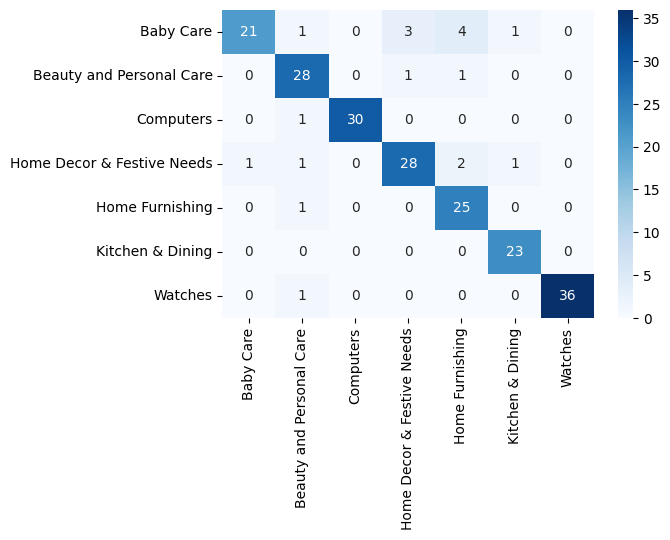

In [ ]:
Eval_PredictionVGG(true_labels=np.array(labels_test), predictions=VGGpred)

Vu les performance, il est rès probable que ces données test faisaient partie des données d'entrapinement du VGG16. Il vaudrait mieuc tester sur le set de test que j'avais défini lors du projet 6 pour mieux comparer les deux modèles.

In [ ]:
donnees_couleur = np.load(path_vgg + "donnees_couleur.npz")
X_test = donnees_couleur['arr3']
y_test = donnees_couleur['arr6']
print(X_test.shape, y_test.shape)

(210, 224, 224, 3) (210, 7)


In [ ]:
logVGGpred_origine = modelVGG.predict(X_test)
VGGpred_origine = np.argmax(logVGGpred_origine, axis=1)

7/7 [==============================] - 130s 17s/step


In [ ]:
labels_test_origine = np.argmax(y_test, axis=1)

Accuracy = 79.048
              precision    recall  f1-score   support

           0       0.66      0.63      0.64        30
           1       0.76      0.87      0.81        30
           2       0.93      0.83      0.88        30
           3       0.67      0.73      0.70        30
           4       0.79      0.73      0.76        30
           5       0.77      0.80      0.79        30
           6       1.00      0.93      0.97        30

    accuracy                           0.79       210
   macro avg       0.80      0.79      0.79       210
weighted avg       0.80      0.79      0.79       210



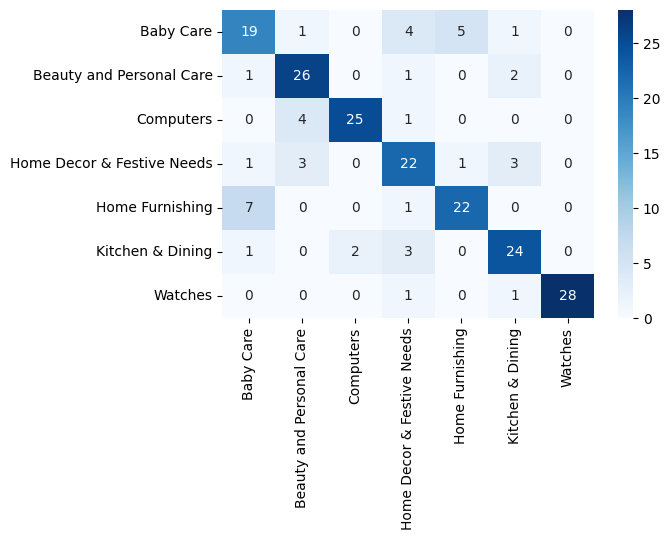

In [ ]:
Eval_PredictionVGG(true_labels=labels_test_origine, predictions=VGGpred_origine)

Voici les performances représentatives pour le modèle VGG16.

# Synthèse global par catégorie

In [ ]:
!pip install lime

In [ ]:
from skimage.segmentation import mark_boundaries
import torch
import torch.nn as nn
import lime
from keras.preprocessing import image

In [ ]:
def transform_img_fn_2(path_list):
    out = []
    for img_path in path_list:
        img = image.load_img(img_path, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = inc_net.preprocess_input(x)
        out.append(x)
    return np.vstack(out)

In [ ]:
# Définir la classe complète incluant CLIP et le classificateur
class FullModel(nn.Module):
    def __init__(self, clip_model, classifier):
        super(FullModel, self).__init__()
        self.clip_model = clip_model
        self.classifier = classifier

    def forward(self, image):
        #if image.dim() == 3: image = image.unsqueeze(0)
        with torch.no_grad():
            features = self.clip_model.encode_image(image)
        output = self.classifier(features)
        output_labels = torch.max(output, 1)[1].numpy()
        return output, output_labels   #, features

# Définir un réseau de neurones simple pour la classification
class Classifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(Classifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 512)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

# Charger le modèle CLIP et les transformations
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model = clip.load("ViT-B/32", device=device)[0]

# Classifier model
classifier = Classifier(512, 7).to(device)

csv_file_2 = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 8/approche_2/'
def LoadWeight(epoch=3):
  """
  Charge les poids d'une epoch d'entraînement: epoch
  renvoi le modele avec les poids
  """
  # chargement des poids
  weight_file = f'classifier_epoch_{epoch}.pth'
  classifier.load_state_dict(torch.load(csv_file_2 + '/' + weight_file))
  return classifier

classifier = LoadWeight(epoch=3)

# Créer le modèle complet
model = FullModel(clip_model, classifier).to(device)

## Chargement images

In [ ]:
# catégories selon labels
Cat_int_to_text = {0: 'Baby Care',
 1: 'Beauty and Personal Care',
 2: 'Computers',
 3: 'Home Decor & Festive Needs',
 4: 'Home Furnishing',
 5: 'Kitchen & Dining',
 6: 'Watches'}

#extrait de 5 images de la catégorie watches
path_cat = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/'
img_list = ['f2aaeda52ac1f77c2886af013fded02b.jpg', 'e15195f2a5ebaa2168ccd65324e65e8e.jpg', 'e2cec0756030a25f294ead3acc0570d2.jpg', 'd98fac46793639eceaaa2e74cadd4973.jpg', 'd7ca2b06b4f4d3b98c61c377b18a2d6b.jpg']
path_img_cat_6 = [path_cat_6 + img for img in img_list]

In [ ]:
path_cat = '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/'

# Parcourir chaque dossier dans le chemin spécifié
images_path = []
cat_name = []
unique_cat_name = []
for folder in os.listdir(path_cat):
    unique_cat_name.append(folder)
    folder_path = os.path.join(path_cat, folder)
    if os.path.isdir(folder_path):
        # Lister les fichiers dans le dossier
        files = os.listdir(folder_path)
        # Prendre les 10 premiers fichiers
        selected_files = files[:10]
        for file in selected_files:
            file_path = os.path.join(folder_path, file)
            if os.path.isfile(file_path):
                images_path.append(file_path)
                cat_name.append(folder)


In [ ]:
images_path

['/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/Kitchen & Dining/f1484a63c0dc79e96c98b2a250380ed8.jpg',
 '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/Kitchen & Dining/614dbfa2f42c4684c0bb6152091113a6.jpg',
 '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/Kitchen & Dining/5a7a1287fef0d986a5e237797beee286.jpg',
 '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/Kitchen & Dining/503bb08f7bdf6a395ec564dd1dc83619.jpg',
 '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/Kitchen & Dining/41fd5af61752be98b19b611a6ff9a0ef.jpg',
 '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Lucas GAMBA/Projet 6/data/Flipkart/Images/test/Kitchen & Dining/2110699b945ae766c8b8112038ac58b9.jpg',
 '/content/drive/MyDrive/FORMATION DATASCIENTIST OC - Luca

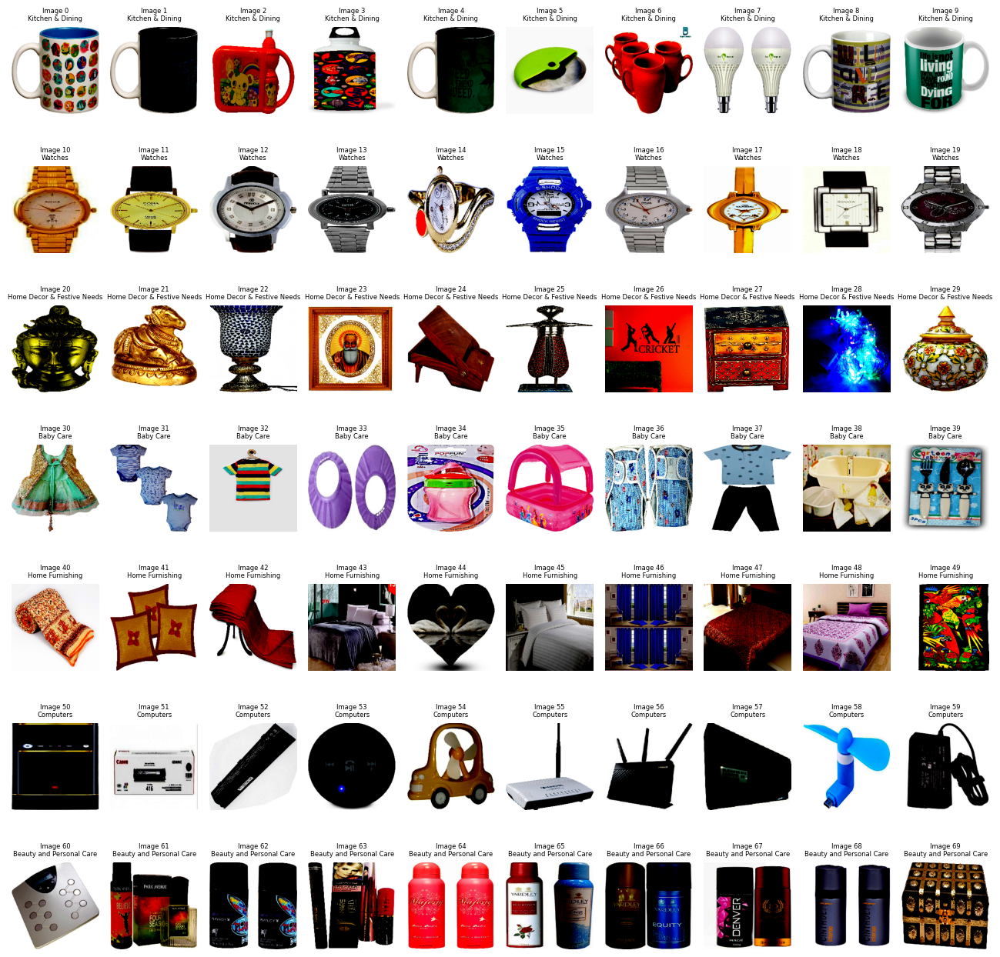

In [ ]:
plt.figure(figsize=(13, 13))
# Afficher les images
for x in range(images_cat.shape[0]):

  ax = plt.subplot(7, 10, x+1)
  plt.imshow(images_cat[x], cmap='gray')
  plt.title(f'Image {x}\n{cat_name[x]}', fontsize=6)
  plt.axis("off")

# Ajuster l'espace entre les sous-graphiques
plt.tight_layout()
plt.axis("off")
# Afficher la figure
plt.show()


## Importance locale

In [ ]:
unique_cat_name

['Kitchen & Dining',
 'Watches',
 'Home Decor & Festive Needs',
 'Baby Care',
 'Home Furnishing',
 'Computers',
 'Beauty and Personal Care']

In [ ]:
# définir déb fin indices images à sélectionner dans images_cat
a, b = 0, 5
# indice du nom de cat dans unique_cat_name
cat_num = 0

def LocalImportance(a, b, num_samples=100):

  plt.figure(figsize=(12, 12))
  n = b-a
  # Afficher les n premier segments de la catégories cat_num
  c = 0
  for x in range(a, b):
    # les images
    ax = plt.subplot(3, n, c+1)
    plt.imshow(images_cat[x], cmap='gray')
    plt.title(f'Catégorie image n°{x}: \n{cat_name[x]}', fontsize=10)
    plt.axis("off")
    # best segments
    ax = plt.subplot(3, n, c+n+1)
    explanation = explainer.explain_instance(images_cat[x].astype('double'), classifier_fn, top_labels=1, hide_color=0, num_samples=num_samples)
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=5, hide_rest=False)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.title(f'catégorie prédite: \n {Cat_int_to_text[explanation.top_labels[0]]}', fontsize=10)
    plt.axis("off")
    #Map each explanation weight to the corresponding superpixel
    dict_heatmap = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
    #Plot. The visualization makes more sense if a symmetrical colorbar is used.
    ax = plt.subplot(3, n, c+n+n+1)
    plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
    plt.axis("off")
    plt.title('Map des segments\n par importance', fontsize=10)
    plt.colorbar(shrink=0.35)

    c += 1

  # Ajuster l'espace entre les sous-graphiques
  plt.tight_layout()
  plt.axis("off")

  # Afficher la figure
  plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

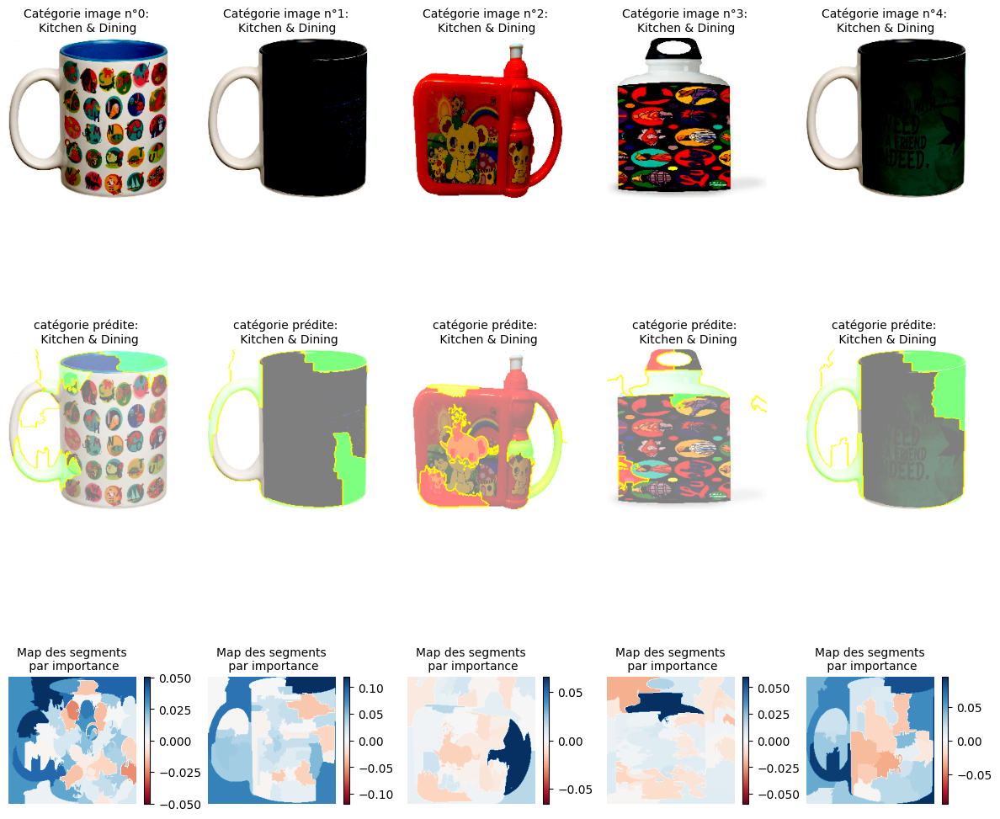

In [ ]:
LocalImportance(a=0, b=5, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

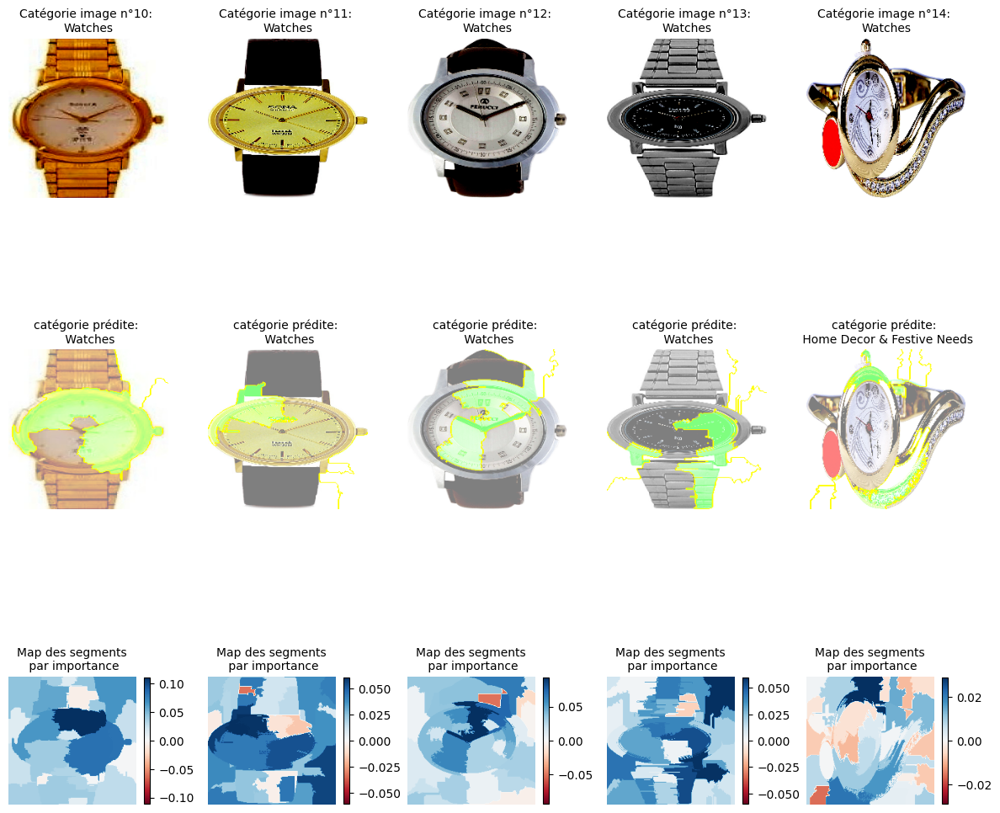

In [ ]:
LocalImportance(a=10, b=15, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

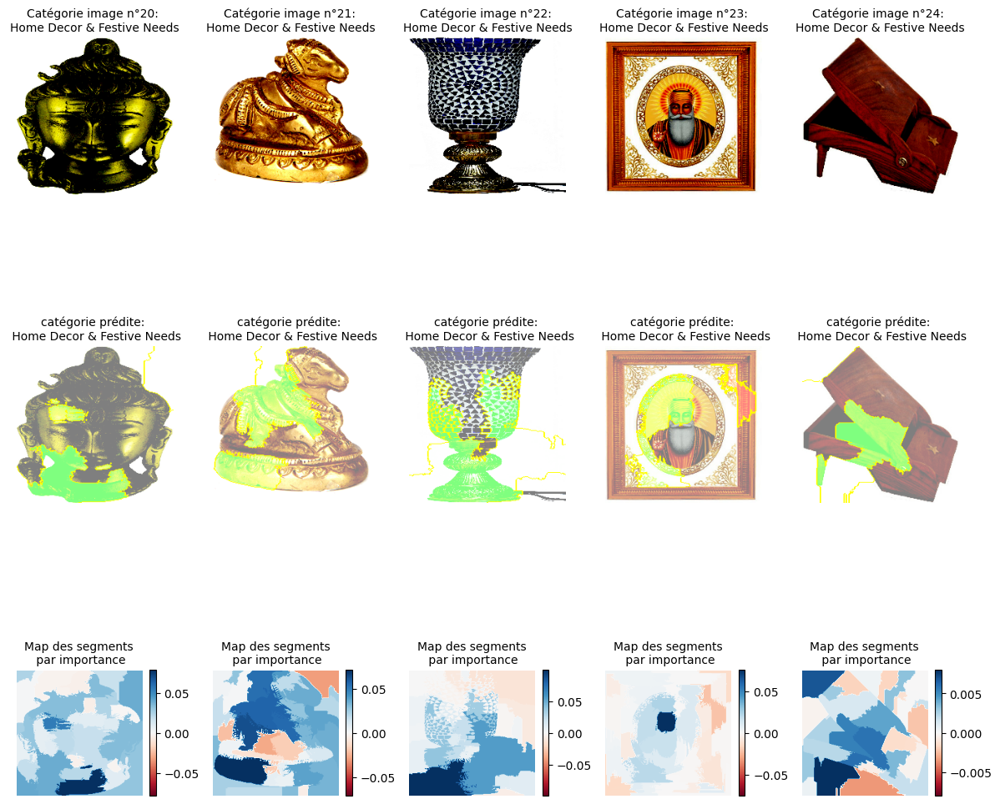

In [ ]:
LocalImportance(a=20, b=25, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

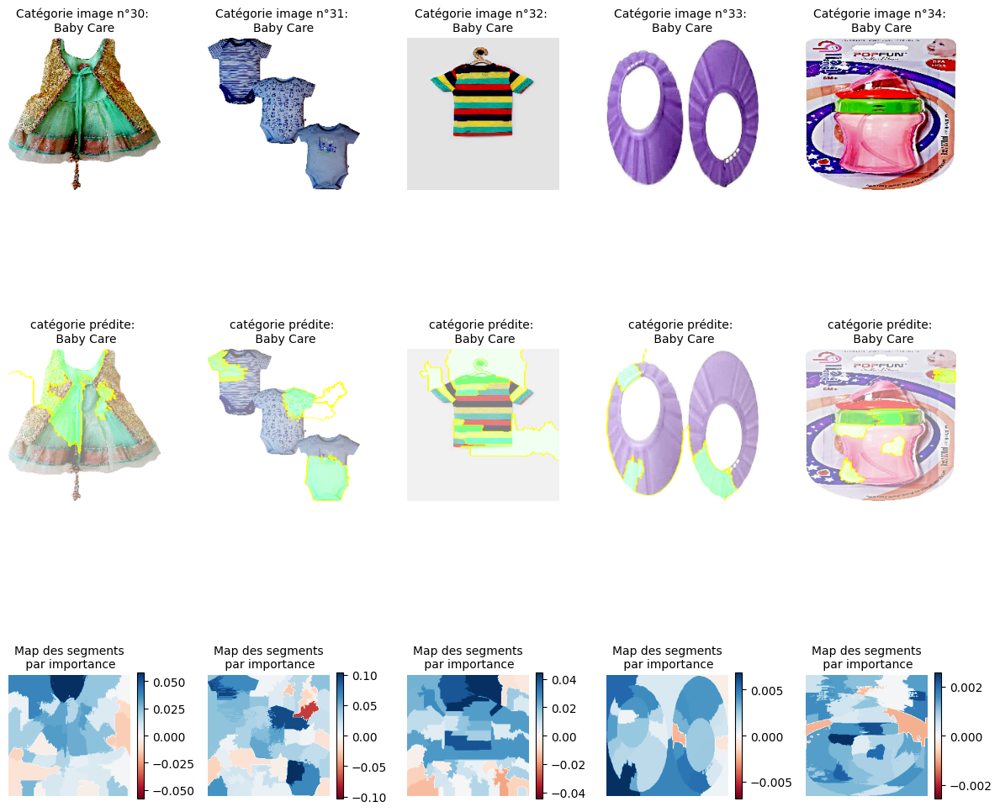

In [ ]:
LocalImportance(a=30, b=35, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

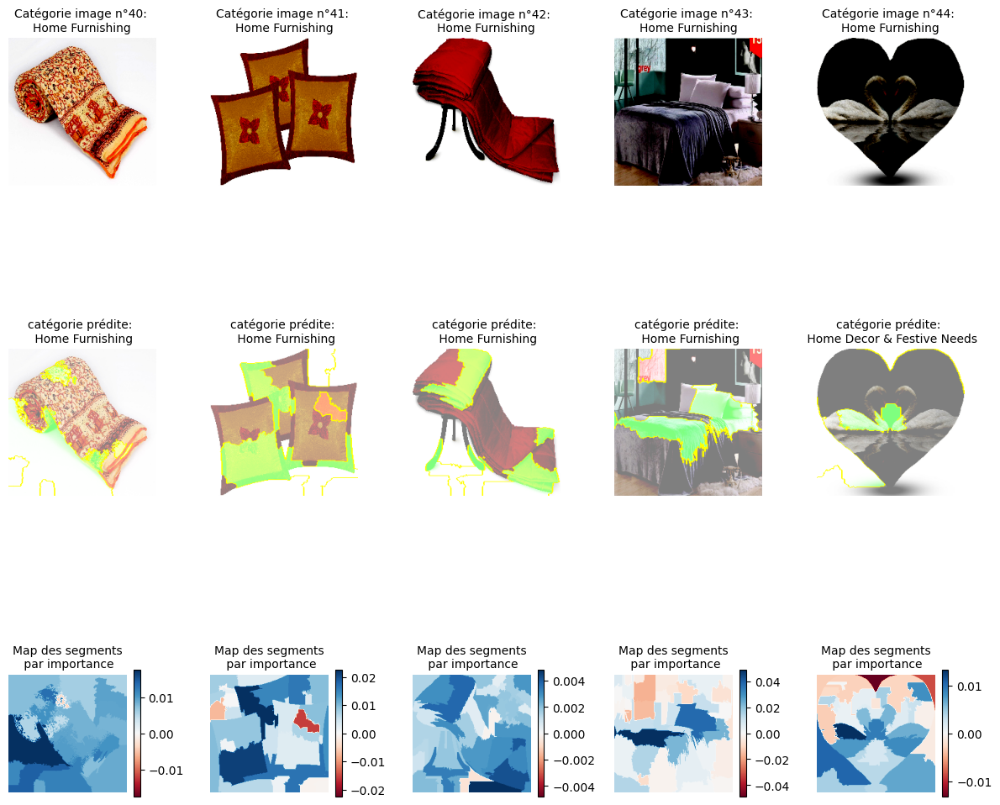

In [ ]:
LocalImportance(a=40, b=45, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

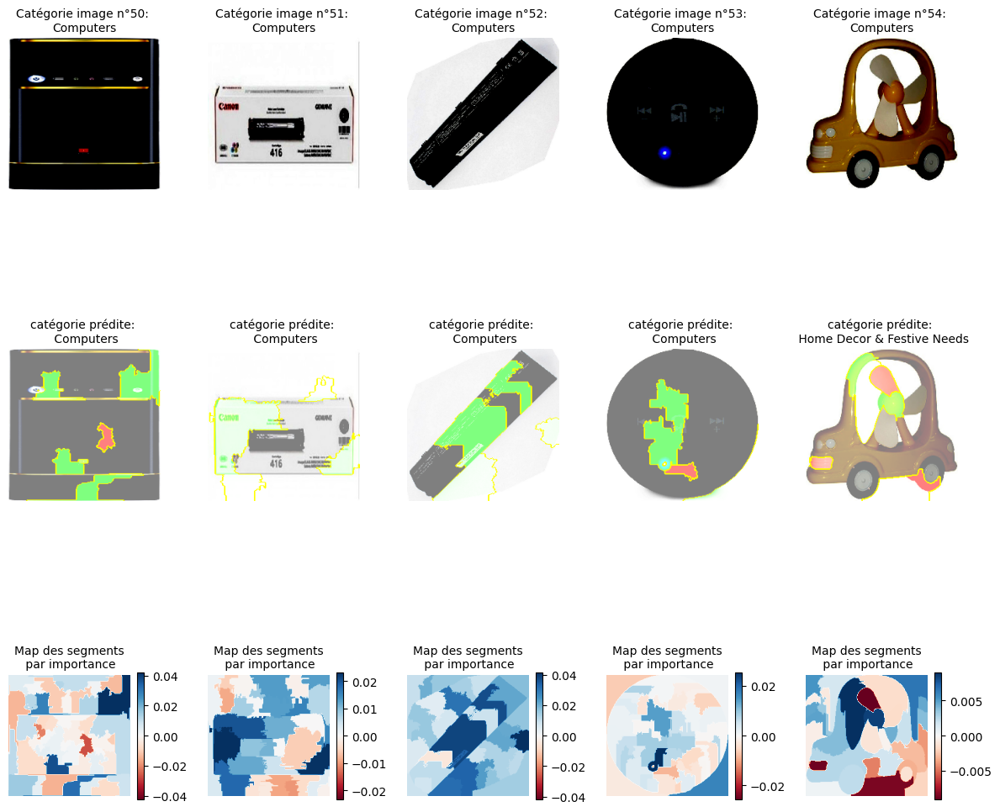

In [ ]:
LocalImportance(a=50, b=55, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

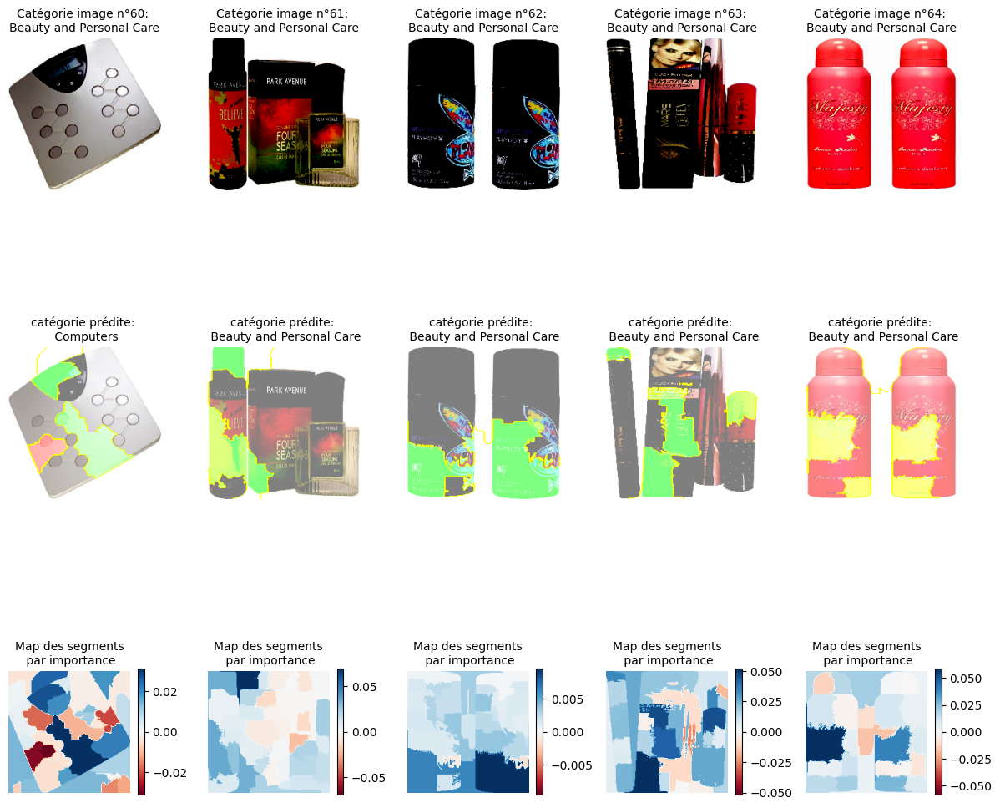

In [ ]:
LocalImportance(a=60, b=65, num_samples=100)

## Importance globale

In [ ]:
def compute_mean_image(a, b, plot=False):
    mean_image = np.mean(np.array(images_cat[a:b+1]), axis=0).astype('double')
    if plot == True:
      plt.imshow(mean_image)
      plt.title(f"Image Moyenne {cat_name[b]}")
      plt.show()
    return mean_image

Moyenne des images pour chaque catégorie.

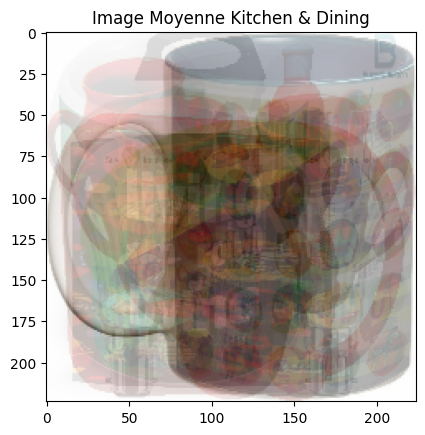

In [ ]:
mean_image_0 = compute_mean_image(0, 9, plot=True)

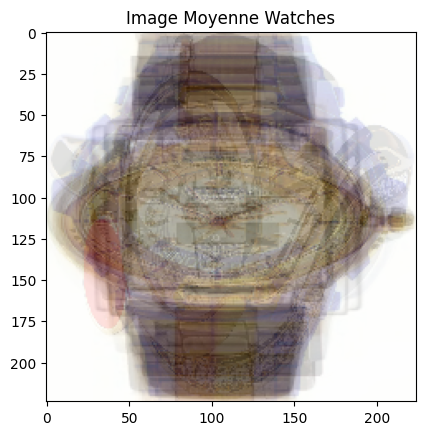

In [ ]:
mean_image_1 = compute_mean_image(10, 19, plot=True)

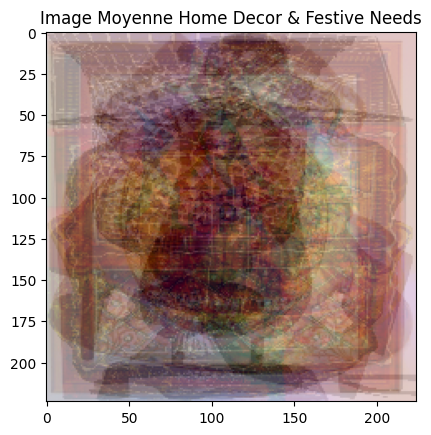

In [ ]:
mean_image_2 = compute_mean_image(20, 29, plot=True)

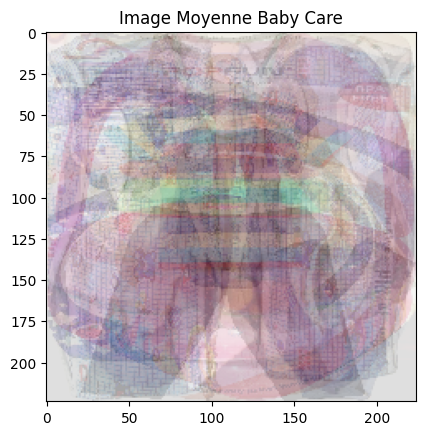

In [ ]:
mean_image_3 = compute_mean_image(30, 39, plot=True)

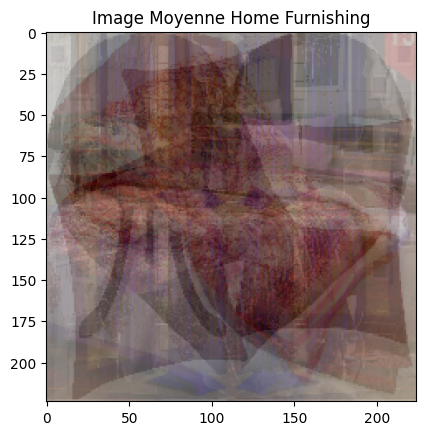

In [ ]:
mean_image_4 = compute_mean_image(40, 49, plot=True)

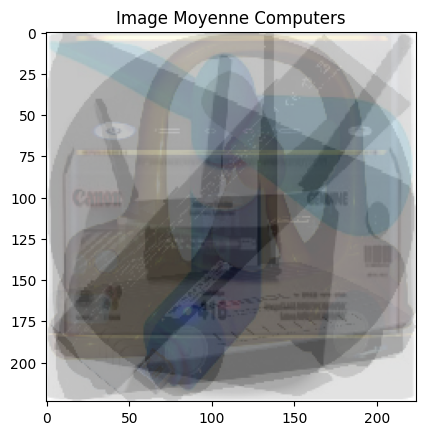

In [ ]:
mean_image_5 = compute_mean_image(50, 59, plot=True)

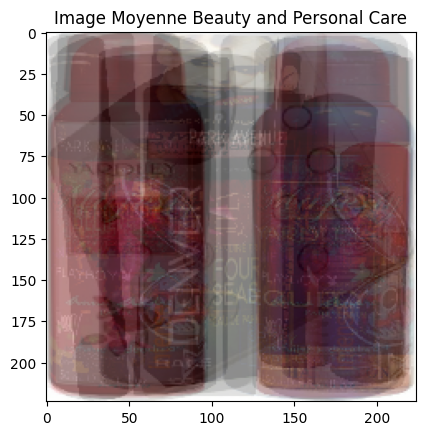

In [ ]:
mean_image_6= compute_mean_image(60, 69, plot=True)

In [ ]:
# Afficher les meilleurs segments
a, b = 0, 9
num_samples = 10
images_cat_x = images_cat[a:b]

def GlobalImportance(a, b, num_samples):
  images_cat_x = images_cat[a:b+1]
  heatmap = np.zeros((images_cat_x[0].shape[0], images_cat_x[0].shape[0]))
  for x in range(10):
    explanation = explainer.explain_instance(images_cat_x[x].astype('double'), classifier_fn, top_labels=1, hide_color=0, num_samples=num_samples)
    #Map each explanation weight to the corresponding superpixel
    dict_heatmap = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap = heatmap + np.vectorize(dict_heatmap.get)(explanation.segments)

  # normalise pour meilleure visibilité
  #heatmap /= np.max(heatmap)
  heatmap /= images_cat_x.shape[0]
  # calcul de l'image moyenne
  mean_image = compute_mean_image(a, b)

  # Visualiser la carte de chaleur superposée à l'image moyenne
  plt.imshow(mean_image)
  plt.imshow(heatmap, cmap='hot', alpha=0.6)
  plt.title(f"Importance Globale {cat_name[b]}")
  plt.colorbar()
  plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

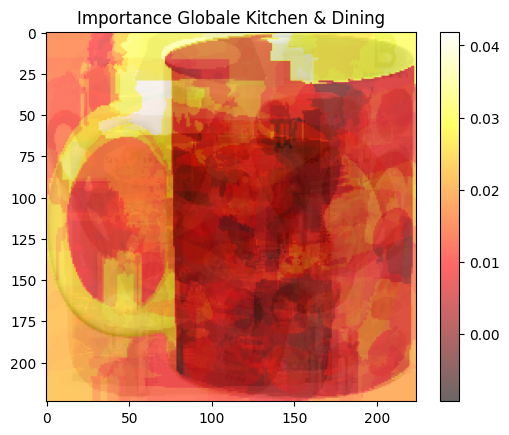

In [ ]:
GlobalImportance(a=0, b=9, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

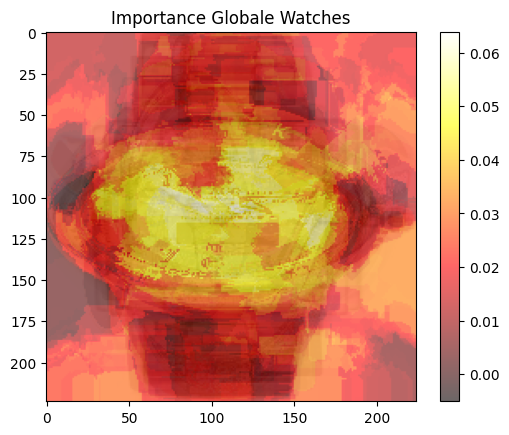

In [ ]:
GlobalImportance(a=10, b=19, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

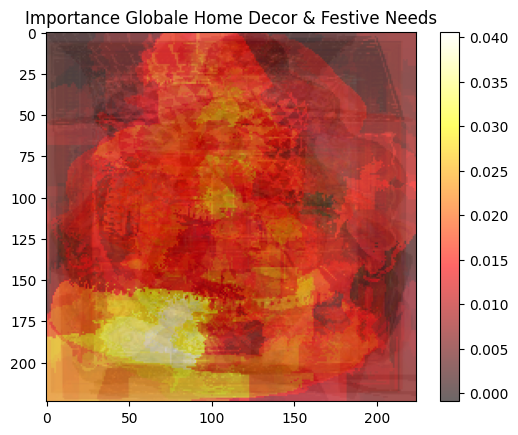

In [ ]:
GlobalImportance(a=20, b=29, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

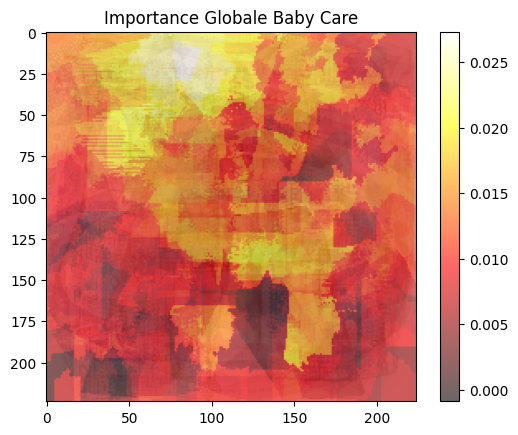

In [ ]:
GlobalImportance(a=30, b=39, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

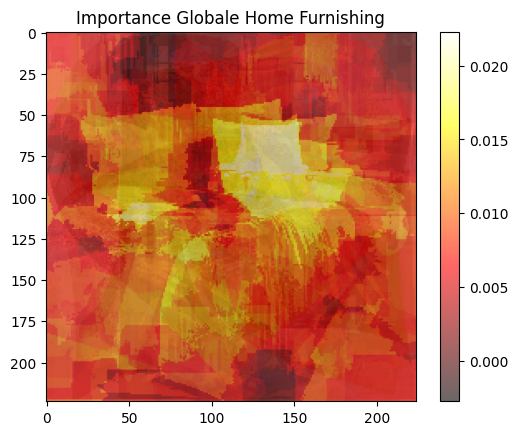

In [ ]:
GlobalImportance(a=40, b=49, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

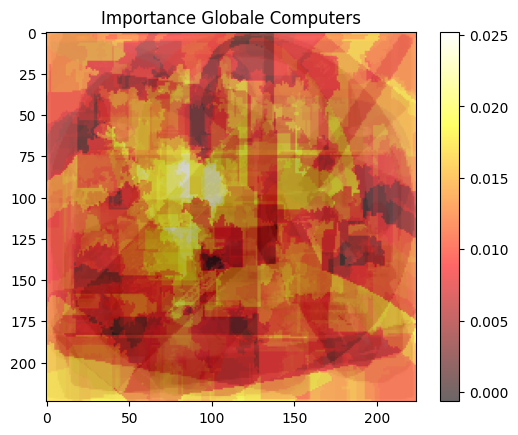

In [ ]:
GlobalImportance(a=50, b=59, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

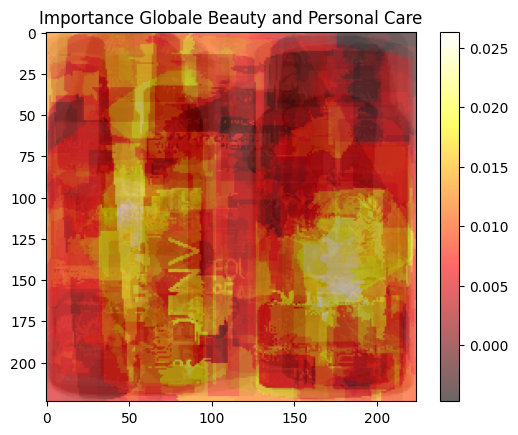

In [ ]:
GlobalImportance(a=60, b=69, num_samples=100)